##### Steps for reading in dataset (following download), initial QC, dim reduction/clustering and saving out the myeloid cluster for **GSE235676**

file previously downloaded:
GSE235676_RAW.tar

unzipped using 
``` bash
tar -xvf GSE235676_RAW.tar
```

This gives the following files: 
* GSM7507506_Pt1_barcodes.tsv.gz
* GSM7507506_Pt1_features.tsv.gz
* GSM7507506_Pt1_matrix.mtx.gz
* GSM7507507_Pt2_barcodes.tsv.gz
* GSM7507507_Pt2_features.tsv.gz
* GSM7507507_Pt2_matrix.mtx.gz
* GSM7507508_Pt3_barcodes.tsv.gz
* GSM7507508_Pt3_features.tsv.gz
* GSM7507508_Pt3_matrix.mtx.gz
* GSM7507509_Pt4_barcodes.tsv.gz
* GSM7507509_Pt4_features.tsv.gz
* GSM7507509_Pt4_matrix.mtx.gz
* GSM7507510_Pt5_barcodes.tsv.gz
* GSM7507510_Pt5_features.tsv.gz
* GSM7507510_Pt5_matrix.mtx.gz
* GSM7507511_Pt6_barcodes.tsv.gz
* GSM7507511_Pt6_features.tsv.gz
* GSM7507511_Pt6_matrix.mtx.gz
* GSM7507512_Pt7_barcodes.tsv.gz
* GSM7507512_Pt7_features.tsv.gz
* GSM7507512_Pt7_matrix.mtx.gz
* GSM7507513_Pt8_barcodes.tsv.gz
* GSM7507513_Pt8_features.tsv.gz
* GSM7507513_Pt8_matrix.mtx.gz
* GSM7507514_Pt9_barcodes.tsv.gz
* GSM7507514_Pt9_features.tsv.gz
* GSM7507514_Pt9_matrix.mtx.gz
* GSM7507515_Pt10_barcodes.tsv.gz
* GSM7507515_Pt10_features.tsv.gz
* GSM7507515_Pt10_matrix.mtx.gz
* GSM7507516_Pt11_barcodes.tsv.gz
* GSM7507516_Pt11_features.tsv.gz
* GSM7507516_Pt11_matrix.mtx.gz
* GSM7507517_Pt12_barcodes.tsv.gz
* GSM7507517_Pt12_features.tsv.gz
* GSM7507517_Pt12_matrix.mtx.gz
* GSM7507518_Pt13_barcodes.tsv.gz
* GSM7507518_Pt13_features.tsv.gz
* GSM7507518_Pt13_matrix.mtx.gz
* GSM7507519_Pt14_barcodes.tsv.gz
* GSM7507519_Pt14_features.tsv.gz
* GSM7507519_Pt14_matrix.mtx.gz
* GSM7507520_Pt15_barcodes.tsv.gz
* GSM7507520_Pt15_features.tsv.gz
* GSM7507520_Pt15_matrix.mtx.gz
* GSM7507521_Pt16_barcodes.tsv.gz
* GSM7507521_Pt16_features.tsv.gz
* GSM7507521_Pt16_matrix.mtx.gz
* GSM7507522_Pt17_barcodes.tsv.gz
* GSM7507522_Pt17_features.tsv.gz
* GSM7507522_Pt17_matrix.mtx.gz
* GSM7507523_Pt18_barcodes.tsv.gz
* GSM7507523_Pt18_features.tsv.gz
* GSM7507523_Pt18_matrix.mtx.gz
* GSM7507524_Pt19_barcodes.tsv.gz
* GSM7507524_Pt19_genes.tsv.gz
* GSM7507524_Pt19_matrix.mtx.gz
* GSM7507525_Pt20_barcodes.tsv.gz
* GSM7507525_Pt20_genes.tsv.gz
* GSM7507525_Pt20_matrix.mtx.gz
* GSM7507526_Pt21_barcodes.tsv.gz
* GSM7507526_Pt21_genes.tsv.gz
* GSM7507526_Pt21_matrix.mtx.gz
* GSM7507527_Pt22_barcodes.tsv.gz
* GSM7507527_Pt22_genes.tsv.gz
* GSM7507527_Pt22_matrix.mtx.gz
* GSM7507528_Pt23_barcodes.tsv.gz
* GSM7507528_Pt23_genes.tsv.gz
* GSM7507528_Pt23_matrix.mtx.gz
* GSM7507529_Pt24_barcodes.tsv.gz
* GSM7507529_Pt24_genes.tsv.gz
* GSM7507529_Pt24_matrix.mtx.gz


Dataset contains scRNAseq of samples from glioblastoma patients treated with anti-PD1, more details on patients can be found in supp table of PMID: 37460871 however all samples were from the brain (however some patients were newly diagnosed whereas others were recurrent and some recieving neoadjuvant combo therapy).

Will initially keep together but could divide by these properties

Pt1 to Pt18 were done with 10x

Pat 19 to Pt 24 were done using GEXSCOPE --> **exclude** (moved to seperate folder)

Samples I'm using transferred to folders and renamed as necessary


In [1]:
#set wd
getwd()
setwd('/scratch/user/s4436039/scdata/GSE235676')
getwd()

[1] "/scratch/user/s4436039/Nikita-project"

[1] "/scratch/user/s4436039/scdata/GSE235676"

In [2]:
#Load packages
library(dplyr)
library(Seurat)
library(patchwork)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect




In [4]:
#load all datasets
Pt01.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt01") 
Pt02.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt02") 
Pt03.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt03") 
Pt04.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt04") 
Pt05.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt05") 
Pt06.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt06") 
Pt07.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt07") 
Pt08.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt08") 
Pt09.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt09") 
Pt10.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt10") 
Pt11.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt11") 
Pt12.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt12") 
Pt13.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt13") 
Pt14.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt14") 
Pt15.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt15") 
Pt16.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt16") 
Pt17.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt17") 
Pt18.data <- Read10X(data.dir = "/scratch/user/s4436039/scdata/GSE235676/Pt18") 

In [6]:
head(colnames(Pt01.data))

[1] "AAACCCACAACGCATT-1" "AAACCCAGTGAATGTA-1" "AAACCCATCCATTCAT-1"
[4] "AAACCCATCTTACCGC-1" "AAACGAAAGCTAGCCC-1" "AAACGAAAGCTCTGTA-1"

In [7]:
#Add dataset info to colnames
colnames(Pt01.data) <- paste0("GSE235676_GLIO_Pt01_", colnames(Pt01.data))
colnames(Pt02.data) <- paste0("GSE235676_GLIO_Pt02_", colnames(Pt02.data))
colnames(Pt03.data) <- paste0("GSE235676_GLIO_Pt03_", colnames(Pt03.data))
colnames(Pt04.data) <- paste0("GSE235676_GLIO_Pt04_", colnames(Pt04.data))
colnames(Pt05.data) <- paste0("GSE235676_GLIO_Pt05_", colnames(Pt05.data))
colnames(Pt06.data) <- paste0("GSE235676_GLIO_Pt06_", colnames(Pt06.data))
colnames(Pt07.data) <- paste0("GSE235676_GLIO_Pt07_", colnames(Pt07.data))
colnames(Pt08.data) <- paste0("GSE235676_GLIO_Pt08_", colnames(Pt08.data))
colnames(Pt09.data) <- paste0("GSE235676_GLIO_Pt09_", colnames(Pt09.data))
colnames(Pt10.data) <- paste0("GSE235676_GLIO_Pt10_", colnames(Pt10.data))
colnames(Pt11.data) <- paste0("GSE235676_GLIO_Pt11_", colnames(Pt11.data))
colnames(Pt12.data) <- paste0("GSE235676_GLIO_Pt12_", colnames(Pt12.data))
colnames(Pt13.data) <- paste0("GSE235676_GLIO_Pt13_", colnames(Pt13.data))
colnames(Pt14.data) <- paste0("GSE235676_GLIO_Pt14_", colnames(Pt14.data))
colnames(Pt15.data) <- paste0("GSE235676_GLIO_Pt15_", colnames(Pt15.data))
colnames(Pt16.data) <- paste0("GSE235676_GLIO_Pt16_", colnames(Pt16.data))
colnames(Pt17.data) <- paste0("GSE235676_GLIO_Pt17_", colnames(Pt17.data))
colnames(Pt18.data) <- paste0("GSE235676_GLIO_Pt18_", colnames(Pt18.data))

In [8]:
head(colnames(Pt01.data))
head(colnames(Pt13.data))

[1] "GSE235676_GLIO_Pt01_AAACCCACAACGCATT-1"
[2] "GSE235676_GLIO_Pt01_AAACCCAGTGAATGTA-1"
[3] "GSE235676_GLIO_Pt01_AAACCCATCCATTCAT-1"
[4] "GSE235676_GLIO_Pt01_AAACCCATCTTACCGC-1"
[5] "GSE235676_GLIO_Pt01_AAACGAAAGCTAGCCC-1"
[6] "GSE235676_GLIO_Pt01_AAACGAAAGCTCTGTA-1"

[1] "GSE235676_GLIO_Pt13_AAACCCAAGATAACGT-1"
[2] "GSE235676_GLIO_Pt13_AAACCCACAATAGTAG-1"
[3] "GSE235676_GLIO_Pt13_AAACCCATCGAACGGA-1"
[4] "GSE235676_GLIO_Pt13_AAACGCTAGACGAGCT-1"
[5] "GSE235676_GLIO_Pt13_AAACGCTGTTGGGCCT-1"
[6] "GSE235676_GLIO_Pt13_AAACGCTTCATTGCGA-1"

In [9]:
#create seperate seurat object for each sample
Pt01 <- CreateSeuratObject(counts = Pt01.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt01@meta.data$sample_type <- "tumour"
Pt01@meta.data$cancer_type <- "GBM"
Pt01@meta.data$patient_id <- "Pt01"
Pt01@meta.data$sample_id <- "GSE235676_GBM_Pt01"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [10]:
#create seperate seurat object for each sample
Pt02 <- CreateSeuratObject(counts = Pt02.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt02@meta.data$sample_type <- "tumour"
Pt02@meta.data$cancer_type <- "GBM"
Pt02@meta.data$patient_id <- "Pt02"
Pt02@meta.data$sample_id <- "GSE235676_GBM_Pt02"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [11]:
#create seperate seurat object for each sample
Pt03 <- CreateSeuratObject(counts = Pt03.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt03@meta.data$sample_type <- "tumour"
Pt03@meta.data$cancer_type <- "GBM"
Pt03@meta.data$patient_id <- "Pt03"
Pt03@meta.data$sample_id <- "GSE235676_GBM_Pt03"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [12]:
#create seperate seurat object for each sample
Pt04 <- CreateSeuratObject(counts = Pt04.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt04@meta.data$sample_type <- "tumour"
Pt04@meta.data$cancer_type <- "GBM"
Pt04@meta.data$patient_id <- "Pt04"
Pt04@meta.data$sample_id <- "GSE235676_GBM_Pt04"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [13]:
#create seperate seurat object for each sample
Pt05 <- CreateSeuratObject(counts = Pt05.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt05@meta.data$sample_type <- "tumour"
Pt05@meta.data$cancer_type <- "GBM"
Pt05@meta.data$patient_id <- "Pt05"
Pt05@meta.data$sample_id <- "GSE235676_GBM_Pt05"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [14]:
#create seperate seurat object for each sample
Pt06 <- CreateSeuratObject(counts = Pt06.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt06@meta.data$sample_type <- "tumour"
Pt06@meta.data$cancer_type <- "GBM"
Pt06@meta.data$patient_id <- "Pt06"
Pt06@meta.data$sample_id <- "GSE235676_GBM_Pt06"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [15]:
#create seperate seurat object for each sample
Pt07 <- CreateSeuratObject(counts = Pt07.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt07@meta.data$sample_type <- "tumour"
Pt07@meta.data$cancer_type <- "GBM"
Pt07@meta.data$patient_id <- "Pt07"
Pt07@meta.data$sample_id <- "GSE235676_GBM_Pt07"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [16]:
#create seperate seurat object for each sample
Pt08 <- CreateSeuratObject(counts = Pt08.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt08@meta.data$sample_type <- "tumour"
Pt08@meta.data$cancer_type <- "GBM"
Pt08@meta.data$patient_id <- "Pt08"
Pt08@meta.data$sample_id <- "GSE235676_GBM_Pt08"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [17]:
#create seperate seurat object for each sample
Pt09 <- CreateSeuratObject(counts = Pt09.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt09@meta.data$sample_type <- "tumour"
Pt09@meta.data$cancer_type <- "GBM"
Pt09@meta.data$patient_id <- "Pt09"
Pt09@meta.data$sample_id <- "GSE235676_GBM_Pt09"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [18]:
#create seperate seurat object for each sample
Pt10 <- CreateSeuratObject(counts = Pt10.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt10@meta.data$sample_type <- "tumour"
Pt10@meta.data$cancer_type <- "GBM"
Pt10@meta.data$patient_id <- "Pt10"
Pt10@meta.data$sample_id <- "GSE235676_GBM_Pt10"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [19]:
#create seperate seurat object for each sample
Pt11 <- CreateSeuratObject(counts = Pt11.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt11@meta.data$sample_type <- "tumour"
Pt11@meta.data$cancer_type <- "GBM"
Pt11@meta.data$patient_id <- "Pt11"
Pt11@meta.data$sample_id <- "GSE235676_GBM_Pt11"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [20]:
#create seperate seurat object for each sample
Pt12 <- CreateSeuratObject(counts = Pt12.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt12@meta.data$sample_type <- "tumour"
Pt12@meta.data$cancer_type <- "GBM"
Pt12@meta.data$patient_id <- "Pt12"
Pt12@meta.data$sample_id <- "GSE235676_GBM_Pt12"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [21]:
#create seperate seurat object for each sample
Pt13 <- CreateSeuratObject(counts = Pt13.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt13@meta.data$sample_type <- "tumour"
Pt13@meta.data$cancer_type <- "GBM"
Pt13@meta.data$patient_id <- "Pt13"
Pt13@meta.data$sample_id <- "GSE235676_GBM_Pt13"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [22]:
#create seperate seurat object for each sample
Pt14 <- CreateSeuratObject(counts = Pt14.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt14@meta.data$sample_type <- "tumour"
Pt14@meta.data$cancer_type <- "GBM"
Pt14@meta.data$patient_id <- "Pt14"
Pt14@meta.data$sample_id <- "GSE235676_GBM_Pt14"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [23]:
#create seperate seurat object for each sample
Pt15 <- CreateSeuratObject(counts = Pt15.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt15@meta.data$sample_type <- "tumour"
Pt15@meta.data$cancer_type <- "GBM"
Pt15@meta.data$patient_id <- "Pt15"
Pt15@meta.data$sample_id <- "GSE235676_GBM_Pt15"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [24]:
#create seperate seurat object for each sample
Pt16 <- CreateSeuratObject(counts = Pt16.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt16@meta.data$sample_type <- "tumour"
Pt16@meta.data$cancer_type <- "GBM"
Pt16@meta.data$patient_id <- "Pt16"
Pt16@meta.data$sample_id <- "GSE235676_GBM_Pt16"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [25]:
#create seperate seurat object for each sample
Pt17 <- CreateSeuratObject(counts = Pt17.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt17@meta.data$sample_type <- "tumour"
Pt17@meta.data$cancer_type <- "GBM"
Pt17@meta.data$patient_id <- "Pt17"
Pt17@meta.data$sample_id <- "GSE235676_GBM_Pt17"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [26]:
#create seperate seurat object for each sample
Pt18 <- CreateSeuratObject(counts = Pt18.data, project = "GSE235676", min.features = 200)
#add metadata to sample
Pt18@meta.data$sample_type <- "tumour"
Pt18@meta.data$cancer_type <- "GBM"
Pt18@meta.data$patient_id <- "Pt18"
Pt18@meta.data$sample_id <- "GSE235676_GBM_Pt18"

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [27]:
head(Pt01@meta.data) 
head(Pt12@meta.data) 
head(Pt17@meta.data) 

,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
GSE235676_GLIO_Pt01_AAACCCACAACGCATT-1,GSE235676,36594,5585,tumour,GBM,Pt01,GSE235676_GBM_Pt01
GSE235676_GLIO_Pt01_AAACCCAGTGAATGTA-1,GSE235676,500,370,tumour,GBM,Pt01,GSE235676_GBM_Pt01
GSE235676_GLIO_Pt01_AAACCCATCCATTCAT-1,GSE235676,3611,1068,tumour,GBM,Pt01,GSE235676_GBM_Pt01
GSE235676_GLIO_Pt01_AAACCCATCTTACCGC-1,GSE235676,2506,837,tumour,GBM,Pt01,GSE235676_GBM_Pt01
GSE235676_GLIO_Pt01_AAACGAAAGCTAGCCC-1,GSE235676,1103,523,tumour,GBM,Pt01,GSE235676_GBM_Pt01
GSE235676_GLIO_Pt01_AAACGAAAGCTCTGTA-1,GSE235676,1564,654,tumour,GBM,Pt01,GSE235676_GBM_Pt01


,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
GSE235676_GLIO_Pt12_AAACGAAGTCCCTGAG-1,GSE235676,1107,583,tumour,GBM,Pt12,GSE235676_GBM_Pt12
GSE235676_GLIO_Pt12_AAACGAAGTTGACGGA-1,GSE235676,30958,6575,tumour,GBM,Pt12,GSE235676_GBM_Pt12
GSE235676_GLIO_Pt12_AAAGAACCACAGTCGC-1,GSE235676,7368,2230,tumour,GBM,Pt12,GSE235676_GBM_Pt12
GSE235676_GLIO_Pt12_AAAGAACTCGAACGCC-1,GSE235676,1183,534,tumour,GBM,Pt12,GSE235676_GBM_Pt12
GSE235676_GLIO_Pt12_AAAGGATAGGTGCCTC-1,GSE235676,1513,233,tumour,GBM,Pt12,GSE235676_GBM_Pt12
GSE235676_GLIO_Pt12_AAAGGTACAGATGCGA-1,GSE235676,2896,1637,tumour,GBM,Pt12,GSE235676_GBM_Pt12


,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
GSE235676_GLIO_Pt17_AAACCTGAGACAGGCT-1,GSE235676,3555,1564,tumour,GBM,Pt17,GSE235676_GBM_Pt17
GSE235676_GLIO_Pt17_AAACCTGAGAGTCTGG-1,GSE235676,7195,3142,tumour,GBM,Pt17,GSE235676_GBM_Pt17
GSE235676_GLIO_Pt17_AAACCTGAGATCCCAT-1,GSE235676,940,705,tumour,GBM,Pt17,GSE235676_GBM_Pt17
GSE235676_GLIO_Pt17_AAACCTGAGGGCTTGA-1,GSE235676,2837,1433,tumour,GBM,Pt17,GSE235676_GBM_Pt17
GSE235676_GLIO_Pt17_AAACCTGAGTATCTCG-1,GSE235676,18471,4640,tumour,GBM,Pt17,GSE235676_GBM_Pt17
GSE235676_GLIO_Pt17_AAACCTGAGTCTCAAC-1,GSE235676,1740,504,tumour,GBM,Pt17,GSE235676_GBM_Pt17


In [29]:
#Merge seurat objects
GBM <- merge(Pt01, y = c(Pt02, Pt03, Pt04, Pt05, Pt06, Pt07, Pt08, Pt09, Pt10, Pt11, Pt12, Pt13, Pt14, Pt15, Pt16, Pt17, Pt18), project = "GSE235676")

In [30]:
GBM
head(GBM@meta.data)
tail(GBM@meta.data)

An object of class Seurat 
33694 features across 81690 samples within 1 assay 
Active assay: RNA (33694 features, 0 variable features)
 18 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8, counts.9, counts.10, counts.11, counts.12, counts.13, counts.14, counts.15, counts.16, counts.17, counts.18

,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
GSE235676_GLIO_Pt01_AAACCCACAACGCATT-1,GSE235676,36594,5585,tumour,GBM,Pt01,GSE235676_GBM_Pt01
GSE235676_GLIO_Pt01_AAACCCAGTGAATGTA-1,GSE235676,500,370,tumour,GBM,Pt01,GSE235676_GBM_Pt01
GSE235676_GLIO_Pt01_AAACCCATCCATTCAT-1,GSE235676,3611,1068,tumour,GBM,Pt01,GSE235676_GBM_Pt01
GSE235676_GLIO_Pt01_AAACCCATCTTACCGC-1,GSE235676,2506,837,tumour,GBM,Pt01,GSE235676_GBM_Pt01
GSE235676_GLIO_Pt01_AAACGAAAGCTAGCCC-1,GSE235676,1103,523,tumour,GBM,Pt01,GSE235676_GBM_Pt01
GSE235676_GLIO_Pt01_AAACGAAAGCTCTGTA-1,GSE235676,1564,654,tumour,GBM,Pt01,GSE235676_GBM_Pt01


,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>
GSE235676_GLIO_Pt18_TTTGTCAGTCTTCAAG-1,GSE235676,1377,885,tumour,GBM,Pt18,GSE235676_GBM_Pt18
GSE235676_GLIO_Pt18_TTTGTCAGTGATGTCT-1,GSE235676,2827,1315,tumour,GBM,Pt18,GSE235676_GBM_Pt18
GSE235676_GLIO_Pt18_TTTGTCAGTTCCACGG-1,GSE235676,4206,1991,tumour,GBM,Pt18,GSE235676_GBM_Pt18
GSE235676_GLIO_Pt18_TTTGTCATCACAGGCC-1,GSE235676,56612,8553,tumour,GBM,Pt18,GSE235676_GBM_Pt18
GSE235676_GLIO_Pt18_TTTGTCATCGCTGATA-1,GSE235676,6374,2249,tumour,GBM,Pt18,GSE235676_GBM_Pt18
GSE235676_GLIO_Pt18_TTTGTCATCTCGAGTA-1,GSE235676,1236,863,tumour,GBM,Pt18,GSE235676_GBM_Pt18


Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


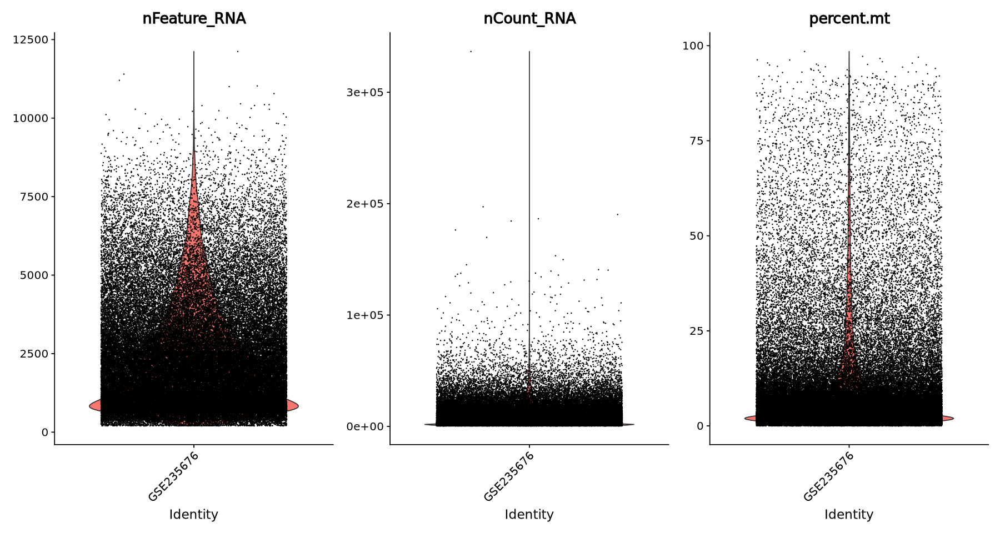

In [31]:
#QC Steps 
GBM[["percent.mt"]] <- PercentageFeatureSet(GBM, pattern = "^MT-")
#Visualise QC metrics
options(repr.plot.height=8, repr.plot.width=15)
VlnPlot(GBM, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

In [32]:
#Normalise the data
GBM <- NormalizeData(GBM)
#Find variable features
GBM <- FindVariableFeatures(GBM, selection.method = "vst", nfeatures = 2000)
#Scale the data
GBM <- ScaleData(GBM, vars.to.regress = c("percent.mt", "nCount_RNA"))
#Run pca
GBM <- RunPCA(GBM, features = VariableFeatures(object = GBM))

Normalizing layer: counts.1

Normalizing layer: counts.2

Normalizing layer: counts.3

Normalizing layer: counts.4

Normalizing layer: counts.5

Normalizing layer: counts.6

Normalizing layer: counts.7

Normalizing layer: counts.8

Normalizing layer: counts.9

Normalizing layer: counts.10

Normalizing layer: counts.11

Normalizing layer: counts.12

Normalizing layer: counts.13

Normalizing layer: counts.14

Normalizing layer: counts.15

Normalizing layer: counts.16

Normalizing layer: counts.17

Normalizing layer: counts.18

Finding variable features for layer counts.1

Finding variable features for layer counts.2

Finding variable features for layer counts.3

Finding variable features for layer counts.4

Finding variable features for layer counts.5

Finding variable features for layer counts.6

Finding variable features for layer counts.7

Finding variable features for layer counts.8

Finding variable features for layer counts.9

Finding variable features for layer counts.10

Finding 

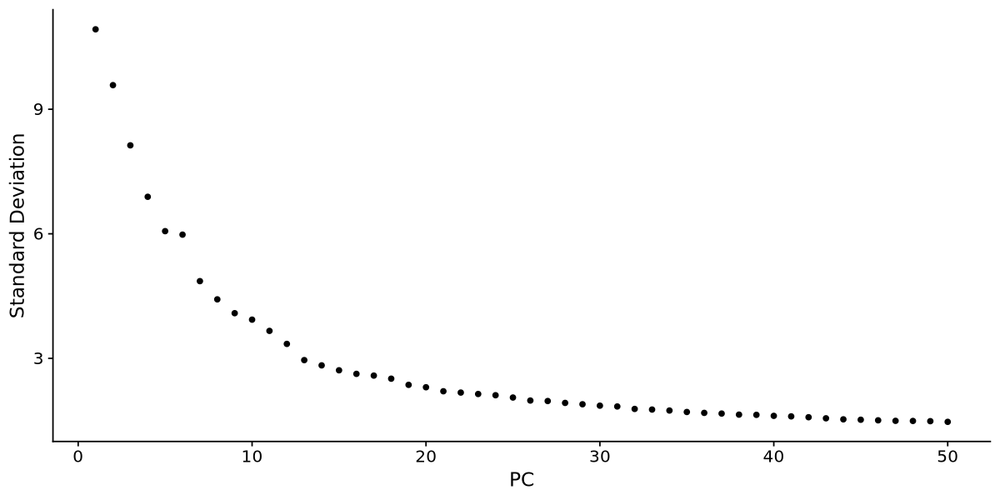

In [34]:
#make elbow plot
options(repr.plot.height=5, repr.plot.width=10)
ElbowPlot(GBM, ndims=50)
#in GSE213243 decided to use 40 PC, staying consistent across datasets

In [35]:
#Find neighbours (make sure number matches no. features chosen above)
GBM <- FindNeighbors(GBM, dims = 1:40)

Computing nearest neighbor graph



Computing SNN



In [36]:
#Run UMAP
GBM <- RunUMAP(GBM, dims = 1:40)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
08:32:16 UMAP embedding parameters a = 0.9922 b = 1.112



08:32:16 Read 81690 rows and found 40 numeric columns

08:32:16 Using Annoy for neighbor search, n_neighbors = 30

08:32:16 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

08:32:23 Writing NN index file to temp file /scratch/temp/9797752/RtmpevRcpq/filea008e5a00188c

08:32:23 Searching Annoy index using 1 thread, search_k = 3000

08:32:48 Annoy recall = 100%

08:32:49 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

08:32:51 Initializing from normalized Laplacian + noise (using RSpectra)

08:32:54 Commencing optimization for 200 epochs, with 3682296 positive edges

08:33:23 Optimization finished



In [37]:
#Cluster, resolution here set to 0.2
GBM <- FindClusters(GBM, resolution = 0.2)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 81690
Number of edges: 2941706

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9670
Number of communities: 17
Elapsed time: 17 seconds


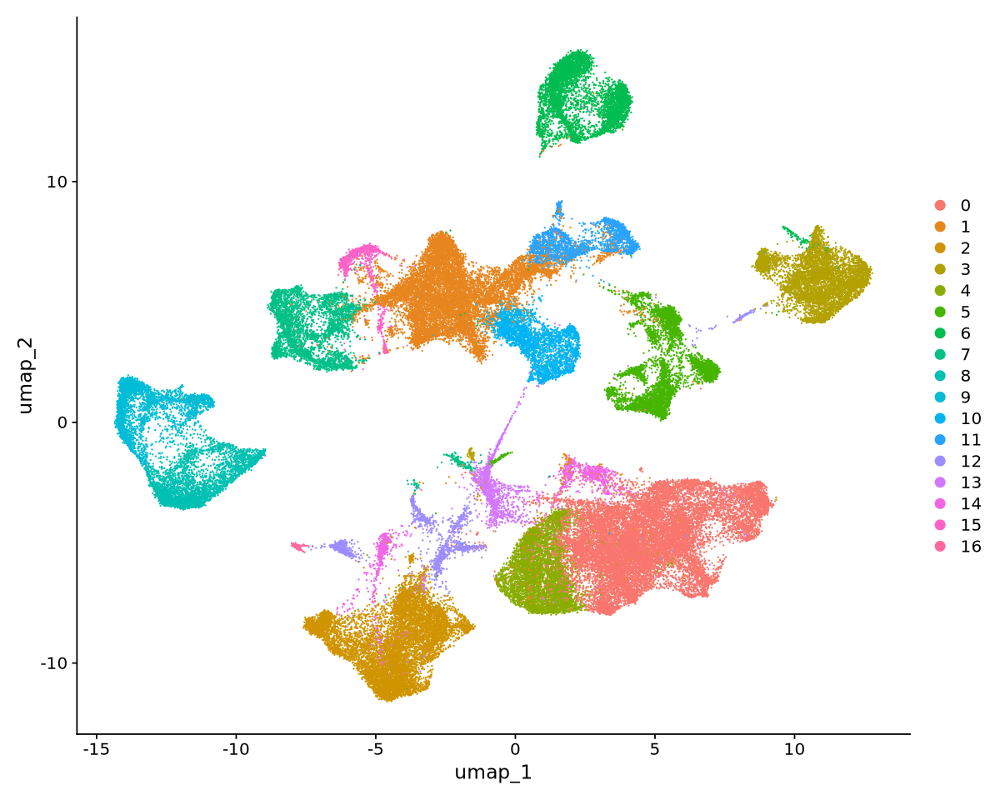

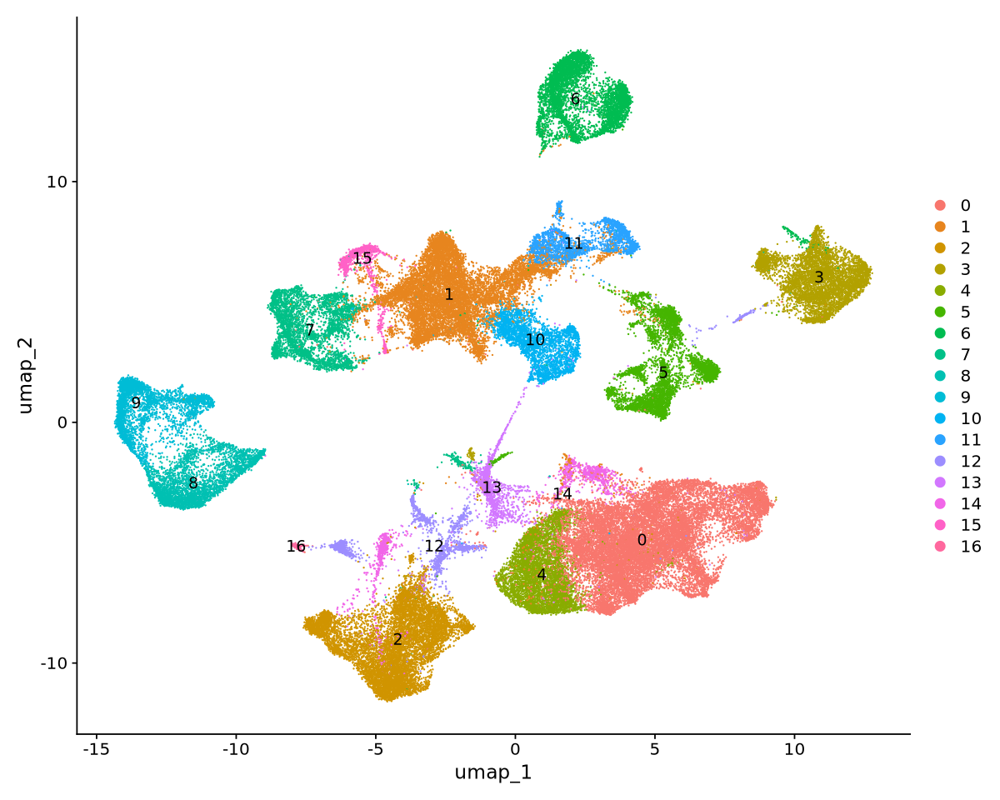

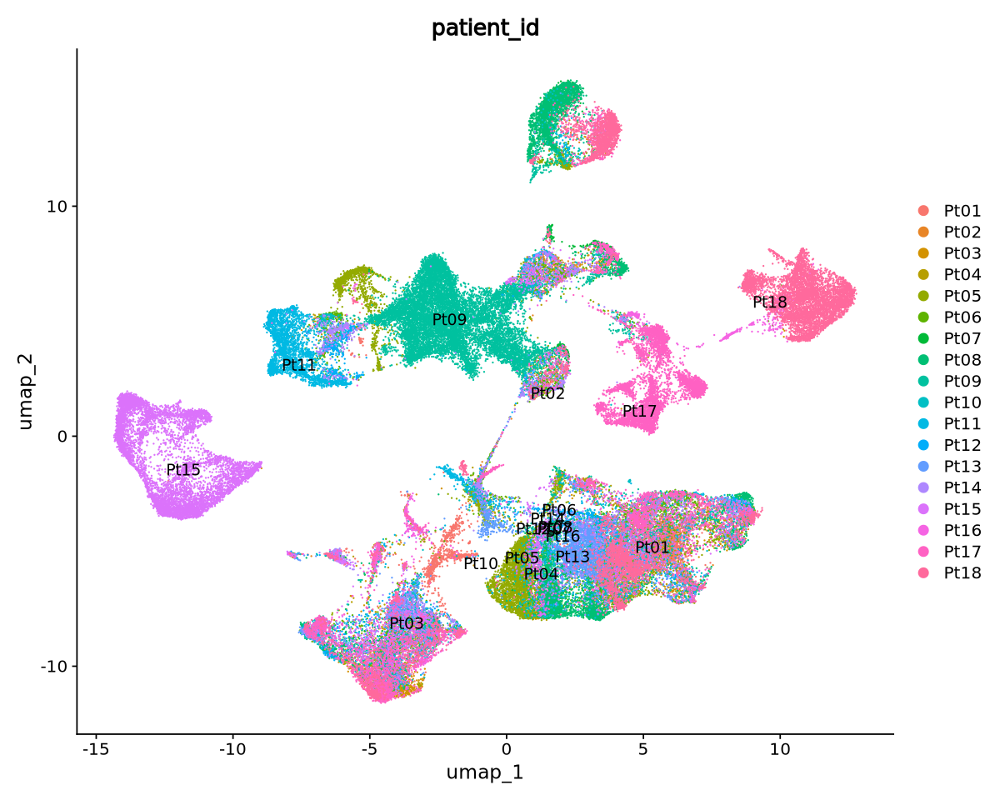

In [38]:
#Plot UMAP
options(repr.plot.height=8, repr.plot.width=10)
DimPlot(GBM, reduction = "umap")
DimPlot(GBM, reduction = "umap", label=TRUE)
DimPlot(GBM, reduction = "umap", label=TRUE, group = "patient_id")

In [39]:
#Save the object at this point so it can be loaded in without running steps above
saveRDS(GBM, file = "/scratch/user/s4436039/scdata/GSE235676/GSE235676.RDS")

#### Next part of code is about determining which cluster is the myeloid cells

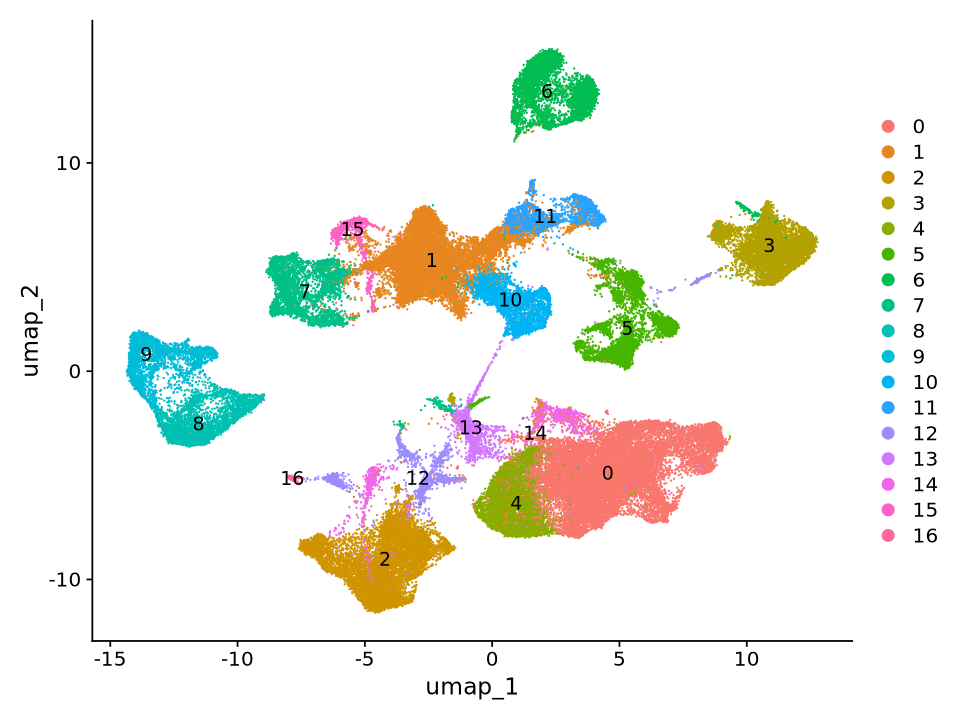

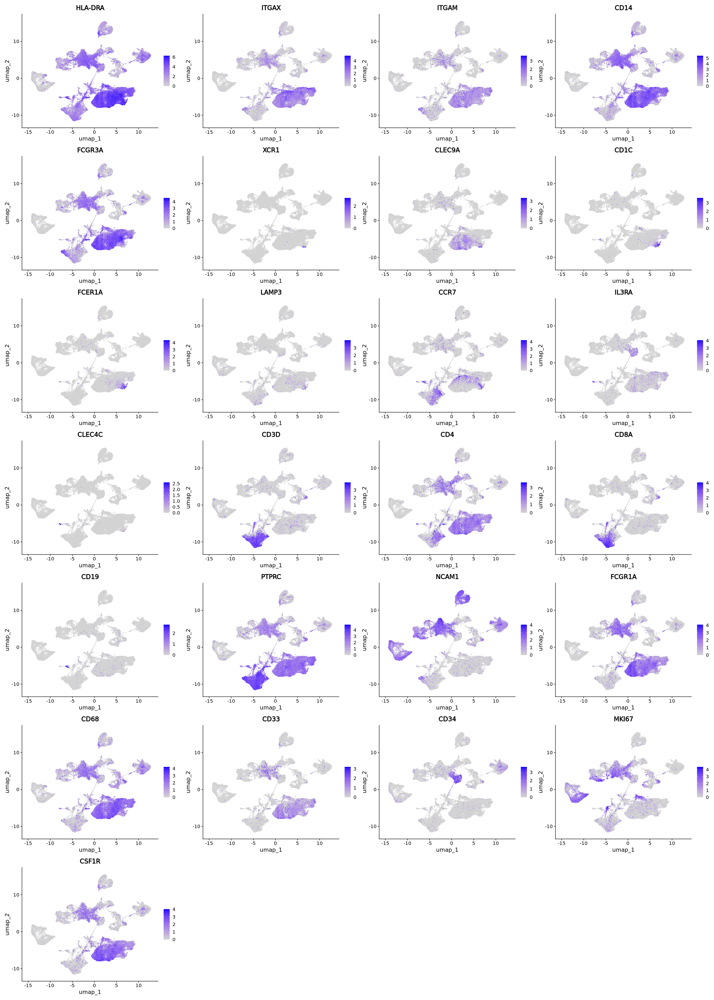

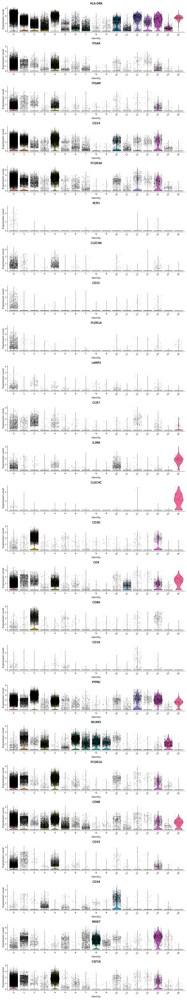

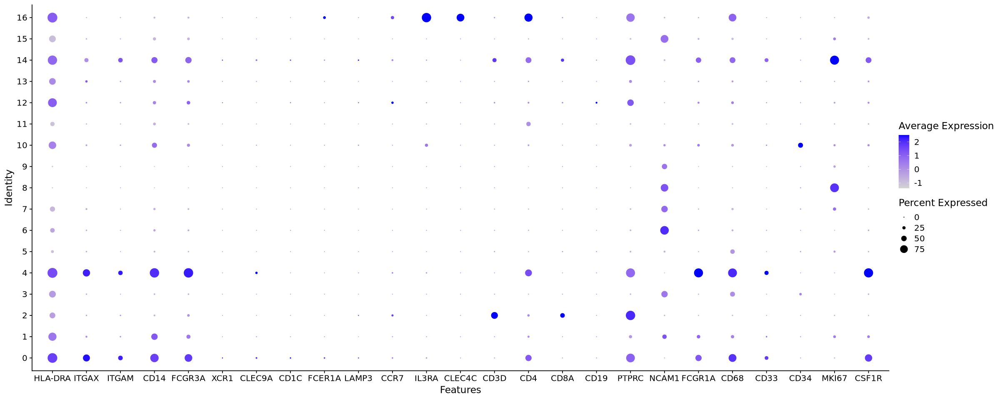

In [40]:
#Same genes over UMAP
options(repr.plot.height=6, repr.plot.width=8)
DimPlot(GBM, reduction = "umap", label=TRUE)

options(repr.plot.height=35, repr.plot.width=25)
FeaturePlot(GBM, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), order = TRUE)

#Violin plots of classic markers
options(repr.plot.height=80, repr.plot.width=15)
VlnPlot(GBM, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"), ncol=1)

#Same as above but dot plot
options(repr.plot.height=8, repr.plot.width=20)
DotPlot(GBM, features = c("HLA-DRA", "ITGAX", "ITGAM", "CD14", "FCGR3A", "XCR1", "CLEC9A", "CD1C", "FCER1A", "LAMP3", "CCR7", "IL3RA", "CLEC4C", "CD3D", "CD4", "CD8A", "CD19", "PTPRC", "NCAM1", "FCGR1A", "CD68", "CD33", "CD34", "MKI67", "CSF1R"))
     

From above it looks like clusters 0,4,14 are the myeloid cells, now subsetting out these clusters

In [41]:
head(GBM@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id,percent.mt,RNA_snn_res.0.2,seurat_clusters
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<fct>
GSE235676_GLIO_Pt01_AAACCCACAACGCATT-1,GSE235676,36594,5585,tumour,GBM,Pt01,GSE235676_GBM_Pt01,5.14292,0,0
GSE235676_GLIO_Pt01_AAACCCAGTGAATGTA-1,GSE235676,500,370,tumour,GBM,Pt01,GSE235676_GBM_Pt01,2.20000,12,12
GSE235676_GLIO_Pt01_AAACCCATCCATTCAT-1,GSE235676,3611,1068,tumour,GBM,Pt01,GSE235676_GBM_Pt01,43.03517,0,0
GSE235676_GLIO_Pt01_AAACCCATCTTACCGC-1,GSE235676,2506,837,tumour,GBM,Pt01,GSE235676_GBM_Pt01,46.96728,0,0
GSE235676_GLIO_Pt01_AAACGAAAGCTAGCCC-1,GSE235676,1103,523,tumour,GBM,Pt01,GSE235676_GBM_Pt01,36.53672,12,12
GSE235676_GLIO_Pt01_AAACGAAAGCTCTGTA-1,GSE235676,1564,654,tumour,GBM,Pt01,GSE235676_GBM_Pt01,25.83120,0,0


In [42]:
myeloid_GBM <- subset(GBM, subset = RNA_snn_res.0.2 %in% c("0","4","14"))

In [43]:
GBM
myeloid_GBM

An object of class Seurat 
33694 features across 81690 samples within 1 assay 
Active assay: RNA (33694 features, 2000 variable features)
 37 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8, counts.9, counts.10, counts.11, counts.12, counts.13, counts.14, counts.15, counts.16, counts.17, counts.18, data.1, data.2, data.3, data.4, data.5, data.6, data.7, data.8, data.9, data.10, data.11, data.12, data.13, data.14, data.15, data.16, data.17, data.18, scale.data
 2 dimensional reductions calculated: pca, umap

An object of class Seurat 
33694 features across 23362 samples within 1 assay 
Active assay: RNA (33694 features, 2000 variable features)
 37 layers present: counts.1, counts.2, counts.3, counts.4, counts.5, counts.6, counts.7, counts.8, counts.9, counts.10, counts.11, counts.12, counts.13, counts.14, counts.15, counts.16, counts.17, counts.18, data.1, data.2, data.3, data.4, data.5, data.6, data.7, data.8, data.9, data.10, data.11, data.12, data.13, data.14, data.15, data.16, data.17, data.18, scale.data
 2 dimensional reductions calculated: pca, umap

In [44]:
saveRDS(myeloid_GBM, "/scratch/user/s4436039/scdata/GSE235676/GSE235676_myeloid.RDS")

#### Following the above then need to move entire GSE235676 folder from scratch to rdm
``` bash
rsync -azvhp /scratch/user/s4436039/scdata/GSE235676/ /QRISdata/Q5935/nikita/scdata/GSE235676
```